# Synthetic audio Resampling Detection


### Import

In [1]:
import numpy as np
from scipy.io.wavfile import write
import numpy as np
import cv2
import scipy.signal
from scipy.signal import medfilt2d
from scipy.ndimage.filters import maximum_filter
from scipy.ndimage.morphology import binary_dilation
from scipy.ndimage.interpolation import geometric_transform
import matplotlib.pylab as plt
import librosa
import librosa.display
from audiotsm import phasevocoder
from audiotsm.io.wav import WavReader, WavWriter
import os
from function_detector import spectrogram_detector

### Generate audio files

In [2]:
sr = 8000
f = 440.0
dur = 3
t_s = np.arange(dur*sr)
fund_a = np.sin(2*np.pi*f*t_s/sr)
first_a = 0.3*np.sin(2*np.pi*2*f*t_s/sr)
sec_a = 0.2*np.sin(2*np.pi*3*f*t_s/sr)
noise = np.int16((np.random.normal(0, 0.1, dur*sr))*32767)
summed_A = np.int16(((0.5*fund_a)+first_a+sec_a)*32767)
all = (noise+summed_A)
write("./audio/input/synthetic/Pure A.wav", sr, np.int16(fund_a*32767))
write("./audio/input/synthetic/Summed Harmonics A.wav", sr, summed_A)
write("./audio/input/synthetic/Noise.wav", sr, noise)
write("./audio/input/synthetic/Noise plus Summed Harmonics.wav", sr, all)



### Generate scaled output

In [3]:
def timescalefolder(inputFolder, outputfolder, tsfactor):
    for file in os.listdir(os.fsencode(inputFolder)):
        filenamestr = os.fsdecode(file)
        filepath = inputFolder+filenamestr

        if (filepath.endswith(".wav")):
            with WavReader(filepath) as reader:
                outputname = outputfolder + filenamestr[0:-4] + " Scaled " + str(tsfactor) + ".wav"
                print(inputFolder, outputfolder, outputname, tsfactor, filenamestr)
                with WavWriter(outputname, reader.channels, reader.samplerate) as writer:
                    tsm = phasevocoder(reader.channels, speed=tsfactor)
                    tsm.run(reader, writer)

timescalefolder("./audio/input/synthetic/", "./audio/synthetic_test/", 0.3)

./audio/input/synthetic/ ./audio/synthetic_test/ ./audio/synthetic_test/Summed Harmonics A Scaled 0.3.wav 0.3 Summed Harmonics A.wav
./audio/input/synthetic/ ./audio/synthetic_test/ ./audio/synthetic_test/Pure A Scaled 0.3.wav 0.3 Pure A.wav
./audio/input/synthetic/ ./audio/synthetic_test/ ./audio/synthetic_test/Noise plus Summed Harmonics Scaled 0.3.wav 0.3 Noise plus Summed Harmonics.wav
./audio/input/synthetic/ ./audio/synthetic_test/ ./audio/synthetic_test/Noise Scaled 0.3.wav 0.3 Noise.wav


### Iterate over all files

./audio/synthetic_test/Pure A Scaled 0.3.wav
Img shape
(129, 3308)
Confidence: 5.819119142103091e-07
Confidence: 7778.984212023637
Spectrogram Detector computed
Img shape
(129, 3308)
Confidence: 3.207560321794034e-07
Confidence: 7721.882531597481
Spectrogram Detector computed
Img shape
(129, 1654)
Confidence: 7.197945794956695e-09
Confidence: 50728.354129870015
Spectrogram Detector computed
Img shape
(129, 1654)
Confidence: 6.43870345928832e-08
Confidence: 45081.11769522237
Spectrogram Detector computed
Img shape
(129, 827)
Confidence: 6.054141543643254e-08
Confidence: 465544.09043065796
Spectrogram Detector computed
Img shape
(129, 827)
Confidence: 1.0812748918453963e-08
Confidence: 89696.90495287132
Spectrogram Detector computed
./audio/synthetic_test/Summed Harmonics A.wav
Img shape
(129, 1034)
Confidence: 1.7059438849997832e-05
Confidence: 2004555.6550251592
Spectrogram Detector computed
Img shape
(129, 1034)
Confidence: 2.0743196369465977e-06
Confidence: 3659.332384450808
Spectrog

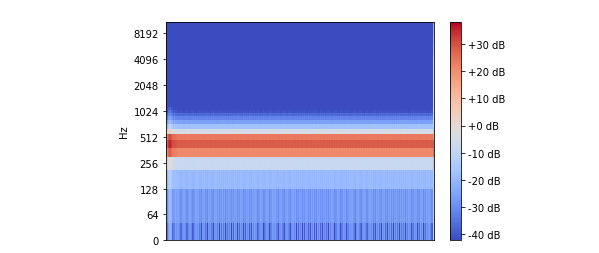

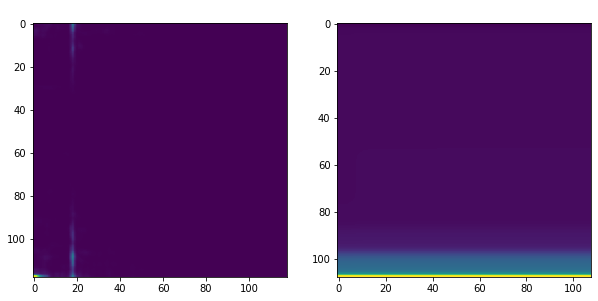

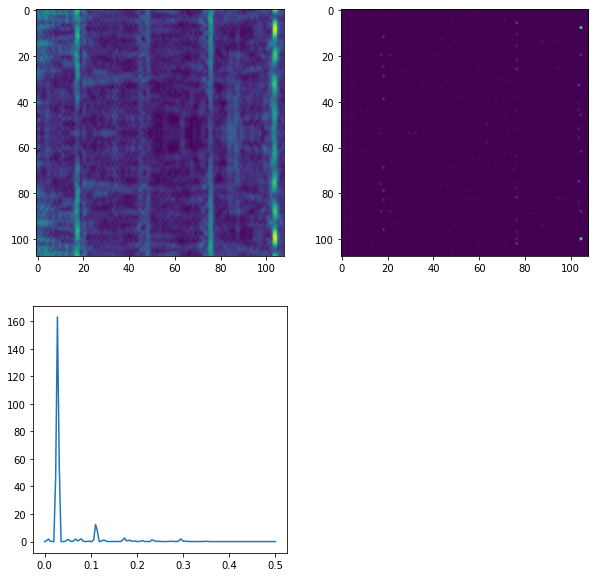

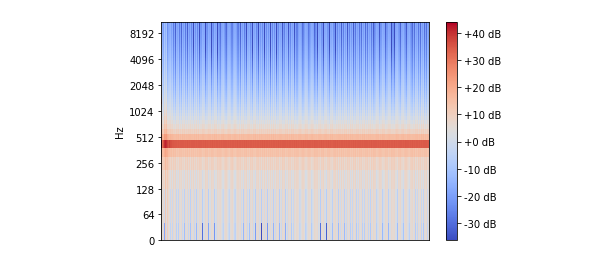

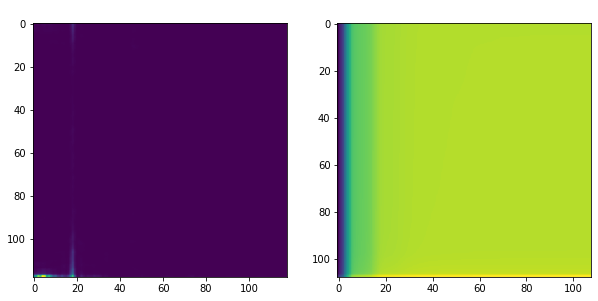

...

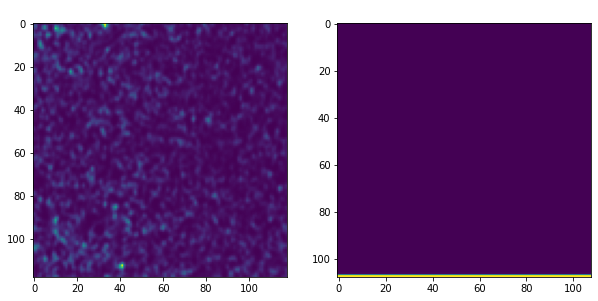

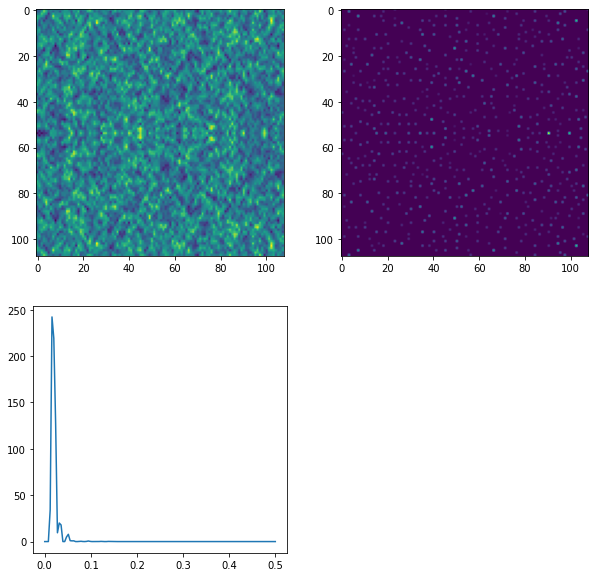

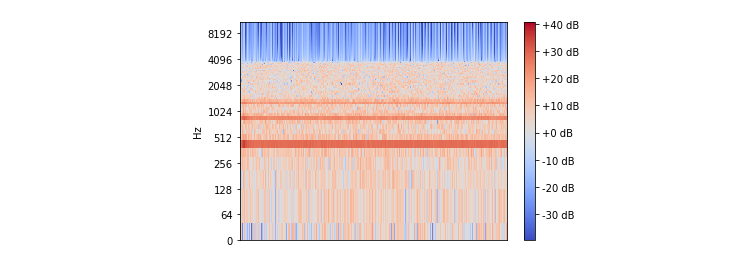

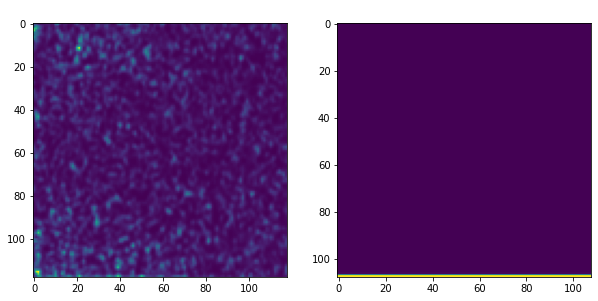

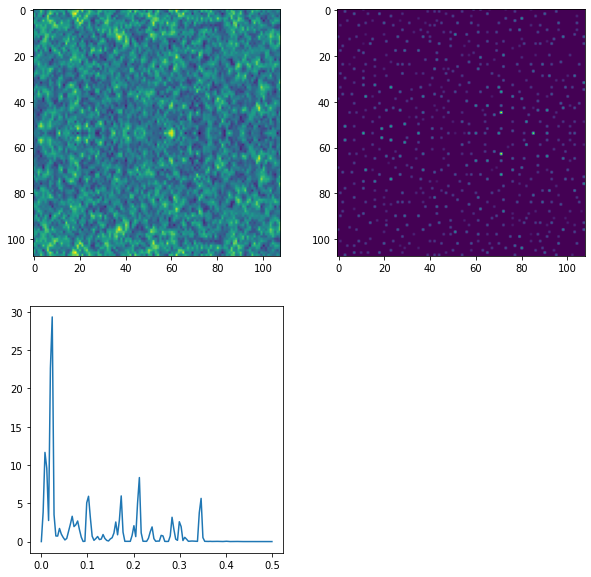

In [4]:
inputFolder = "./audio/synthetic_test/"
hops = [64, 128, 256]
win_types = ['hanning', 'boxcar']

for file in os.listdir(os.fsencode(inputFolder)):
    filenamestr = os.fsdecode(file)
    filepath = inputFolder+filenamestr
    print(filepath)
    if (filepath.endswith(".wav")):
        audio_arr, fs = librosa.load(filepath)
        for hop in hops:
            for win_type in win_types:
                spectrogram = librosa.amplitude_to_db(np.abs(librosa.stft(audio_arr, n_fft=256, hop_length=hop, win_length=256, window=win_type))) #controllare zero-padding
                output_directory = "./audio/synthetic_test/output_detector/"
                fast_output_name = (output_directory + filenamestr + " Fast Detector; HopSize: " + str(hop) + "; Window type: " + win_type + ".png")
                aware_output_name = (output_directory + filenamestr + " Aware Detector; HopSize: " + str(hop) + "; Window type: " + win_type + ".png")


                plt.figure()
                librosa.display.specshow(spectrogram, y_axis='log')
                plt.colorbar(format='%+2.0f dB')
                plt.title(('Log-frequency power spectrogram of ' + filenamestr + "; Hop size: " + str(hop) + "; Window type: " + win_type), color = "white")

                spectrogram_detector(spectrogram, fast_output_name, aware_output_name)
                print("Spectrogram Detector computed")